In [1]:
import os

import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from PIL import Image
import pickle
from trimesh import Trimesh

import image
from utils import get_integer_segments, plot_region_numbers, triangulate_segments

In [2]:
with open('../data/kfs_moge_realsense/kf_51.pkl', 'rb') as file:
    data = pickle.load(file)
image_raw = data['state_dict']['image_raw'].cpu().permute(1,2,0)
sp_regions = data['state_dict']['sp_regions'].cpu().numpy()

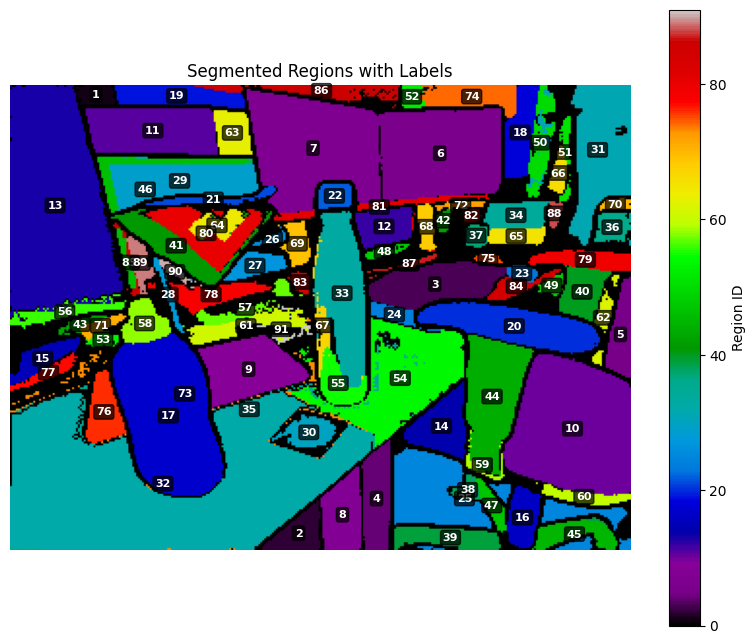

In [3]:
integer_segments = get_integer_segments(sp_regions)
plot_region_numbers(integer_segments)

In [4]:
verts = data['state_dict']['pointmap'].cpu().reshape(-1, 3)
tris = triangulate_segments(verts, integer_segments)
all_tris = [tri for trise in tris for tri in trise]
mesh = Trimesh(vertices=verts, faces=all_tris)
meshes = [Trimesh(vertices=verts, faces=individual_tris) for individual_tris in tris]

In [5]:
mesh.show()

In [6]:
mesh_A = meshes[16]
mesh_A.show()

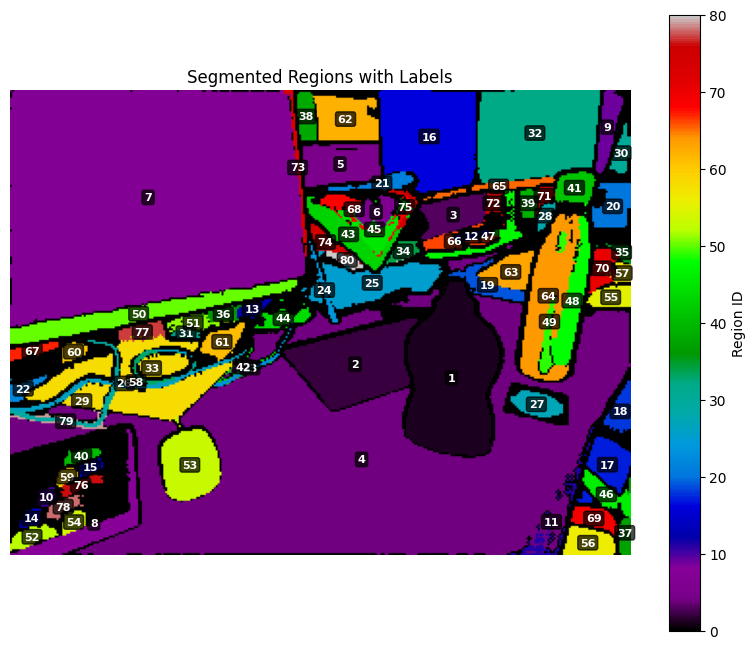

In [7]:
with open('../data/kfs_moge_realsense/kf_101.pkl', 'rb') as file:
    data = pickle.load(file)
image_raw = data['state_dict']['image_raw'].cpu().permute(1,2,0)
sp_regions = data['state_dict']['sp_regions'].cpu().numpy()
integer_segments = get_integer_segments(sp_regions)
plot_region_numbers(integer_segments)

In [8]:
verts = data['state_dict']['pointmap'].cpu().reshape(-1, 3)
tris = triangulate_segments(verts, integer_segments)
all_tris = [tri for trise in tris for tri in trise]
mesh = Trimesh(vertices=verts, faces=all_tris)
meshes = [Trimesh(vertices=verts, faces=individual_tris) for individual_tris in tris]

In [9]:
mesh.show()

In [22]:
mesh_B = meshes[0]
mesh_B.show()
print(np.mean(mesh_B.edges_unique_length))

0.002272198518806743


In [16]:
import open3d as o3d

mesh_source = mesh_A
mesh_target = mesh_B

# Convert to point clouds (use vertices)
source_points = np.asarray(mesh_source.vertices)
target_points = np.asarray(mesh_target.vertices)

# Create Open3D point clouds
pcd_source = o3d.geometry.PointCloud()
pcd_target = o3d.geometry.PointCloud()
pcd_source.points = o3d.utility.Vector3dVector(source_points)
pcd_target.points = o3d.utility.Vector3dVector(target_points)

# Optionally downsample
# pcd_target = pcd_target.voxel_down_sample(voxel_size=0.05)
# pcd_source = pcd_source.voxel_down_sample(voxel_size=0.05)

# Run ICP
threshold = 0.5  # distance threshold
trans_init = np.eye(4)  # initial guess

reg_icp = o3d.pipelines.registration.registration_icp(
    pcd_source, pcd_target, threshold, trans_init,
    o3d.pipelines.registration.TransformationEstimationPointToPoint()
)

# Get transformation matrix
transformation = reg_icp.transformation
print("ICP Transformation:\n", transformation)

# Optionally apply transformation to source mesh
mesh_source.apply_transform(transformation)

import trimesh
combined = trimesh.util.concatenate([mesh_source, mesh_target])
combined.show()

ICP Transformation:
 [[ 9.99985994e-01  8.49361749e-04 -5.22393951e-03  2.10124619e-03]
 [-8.48517729e-04  9.99999627e-01  1.63781944e-04  4.52001565e-05]
 [ 5.22407667e-03 -1.59347044e-04  9.99986342e-01 -6.99779806e-04]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [12]:
pcd_source.points = o3d.utility.Vector3dVector(source_points)
pcd_source_2 = pcd_source.voxel_down_sample(voxel_size=0.01)
o3d.visualization.draw_geometries([pcd_source_2])

In [21]:
import numpy as np
import open3d as o3d
import trimesh

# Assume mesh_A and mesh_B are already loaded Open3D TriangleMesh objects
mesh_source = mesh_A
mesh_target = mesh_B

# -------------------------------
# Step 1: Convert to point clouds
# -------------------------------
pcd_source = o3d.geometry.PointCloud()
pcd_target = o3d.geometry.PointCloud()
pcd_source.points = o3d.utility.Vector3dVector(np.asarray(mesh_source.vertices))
pcd_target.points = o3d.utility.Vector3dVector(np.asarray(mesh_target.vertices))

# -------------------------------
# Step 2: Downsample and compute normals
# -------------------------------
voxel_size = 0.05  # adjust based on your mesh scale
def preprocess_point_cloud(pcd, voxel_size):
    pcd_down = pcd.voxel_down_sample(voxel_size)
    pcd_down.estimate_normals(
        o3d.geometry.KDTreeSearchParamHybrid(radius=voxel_size * 2, max_nn=30))
    fpfh = o3d.pipelines.registration.compute_fpfh_feature(
        pcd_down,
        o3d.geometry.KDTreeSearchParamHybrid(radius=voxel_size * 5, max_nn=100))
    return pcd_down, fpfh

source_down, source_fpfh = preprocess_point_cloud(pcd_source, voxel_size)
target_down, target_fpfh = preprocess_point_cloud(pcd_target, voxel_size)

# -------------------------------
# Step 3: Global registration (RANSAC)
# -------------------------------
distance_threshold = voxel_size * 1.5
result_ransac = o3d.pipelines.registration.registration_ransac_based_on_feature_matching(
    source_down, target_down, source_fpfh, target_fpfh, mutual_filter=True,
    max_correspondence_distance=distance_threshold,
    estimation_method=o3d.pipelines.registration.TransformationEstimationPointToPoint(False),
    ransac_n=4,
    checkers=[
        o3d.pipelines.registration.CorrespondenceCheckerBasedOnEdgeLength(0.9),
        o3d.pipelines.registration.CorrespondenceCheckerBasedOnDistance(distance_threshold)
    ],
    criteria=o3d.pipelines.registration.RANSACConvergenceCriteria(100000, 1000)
)

# -------------------------------
# Step 4: Refine with ICP (point-to-plane)
# -------------------------------
trans_init = result_ransac.transformation
reg_icp = o3d.pipelines.registration.registration_icp(
    source_down, target_down, distance_threshold, trans_init,
    o3d.pipelines.registration.TransformationEstimationPointToPlane()
)
transformation = reg_icp.transformation
print("ICP Transformation:\n", transformation)

# -------------------------------
# Step 5: Apply transformation to original source mesh
# -------------------------------
mesh_source.apply_transform(transformation)

# -------------------------------
# Step 7: Visualize
# -------------------------------
# Convert Open3D meshes to Trimesh
mesh_source.vertex_colors = np.tile([255, 0, 0, 255], (len(mesh_source.vertices), 1))  # RGBA Red
mesh_target.vertex_colors = np.tile([0, 0, 255, 255], (len(mesh_target.vertices), 1))  # RGBA Red

# trimesh_source = trimesh.Trimesh(vertices=np.asarray(mesh_source.vertices),
#                                  faces=np.asarray(mesh_source.triangles),
#                                  vertex_colors=(np.asarray(mesh_source.vertex_colors) * 255).astype(np.uint8))

# trimesh_target = trimesh.Trimesh(vertices=np.asarray(mesh_target.vertices),
#                                  faces=np.asarray(mesh_target.triangles),
#                                  vertex_colors=(np.asarray(mesh_target.vertex_colors) * 255).astype(np.uint8))

combined = trimesh.util.concatenate([mesh_source, mesh_target])
combined.show()


ICP Transformation:
 [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


In [46]:
import numpy as np
import open3d as o3d
import trimesh

# ---------------------------------------------------
# Step 1: Convert Trimesh -> Open3D TriangleMesh
# ---------------------------------------------------
def trimesh_to_open3d(tri_mesh):
    o3d_mesh = o3d.geometry.TriangleMesh()
    o3d_mesh.vertices = o3d.utility.Vector3dVector(tri_mesh.vertices)
    o3d_mesh.triangles = o3d.utility.Vector3iVector(tri_mesh.faces)
    o3d_mesh.compute_vertex_normals()
    return o3d_mesh

mesh_source_o3d = trimesh_to_open3d(mesh_source)
mesh_target_o3d = trimesh_to_open3d(mesh_target)

# ---------------------------------------------------
# Step 2: Convert meshes to point clouds
# ---------------------------------------------------
pcd_source = o3d.geometry.PointCloud()
pcd_target = o3d.geometry.PointCloud()
pcd_source.points = mesh_source_o3d.vertices
pcd_target.points = mesh_target_o3d.vertices

# ---------------------------------------------------
# Step 3: Preprocess (downsample, normals, FPFH)
# ---------------------------------------------------
voxel_size = 0.005  # Adjusted based on edge length ~0.002

def preprocess_point_cloud(pcd, voxel_size):
    pcd_down = pcd.voxel_down_sample(voxel_size)
    pcd_down.estimate_normals(
        o3d.geometry.KDTreeSearchParamHybrid(radius=voxel_size * 2, max_nn=30))
    fpfh = o3d.pipelines.registration.compute_fpfh_feature(
        pcd_down,
        o3d.geometry.KDTreeSearchParamHybrid(radius=voxel_size * 5, max_nn=100))
    return pcd_down, fpfh

source_down, source_fpfh = preprocess_point_cloud(pcd_source, voxel_size)
target_down, target_fpfh = preprocess_point_cloud(pcd_target, voxel_size)

# ---------------------------------------------------
# Step 4: Global alignment using RANSAC
# ---------------------------------------------------
distance_threshold = voxel_size * 1.5
result_ransac = o3d.pipelines.registration.registration_ransac_based_on_feature_matching(
    source_down, target_down, source_fpfh, target_fpfh, mutual_filter=True,
    max_correspondence_distance=distance_threshold,
    estimation_method=o3d.pipelines.registration.TransformationEstimationPointToPoint(False),
    ransac_n=4,
    checkers=[
        o3d.pipelines.registration.CorrespondenceCheckerBasedOnEdgeLength(0.9),
        o3d.pipelines.registration.CorrespondenceCheckerBasedOnDistance(distance_threshold)
    ],
    criteria=o3d.pipelines.registration.RANSACConvergenceCriteria(100000, 1000)
)

# ---------------------------------------------------
# Step 5: Refine with ICP (Point-to-Plane)
# ---------------------------------------------------
trans_init = result_ransac.transformation
reg_icp = o3d.pipelines.registration.registration_icp(
    source_down, target_down, distance_threshold, trans_init,
    o3d.pipelines.registration.TransformationEstimationPointToPlane()
)
transformation = reg_icp.transformation
print("ICP Transformation:\n", transformation)

# ---------------------------------------------------
# Step 6: Apply transformation and color in Open3D
# ---------------------------------------------------
mesh_source_o3d.transform(transformation)
mesh_source_o3d.paint_uniform_color([1.0, 0.0, 0.0])  # Red
mesh_target_o3d.paint_uniform_color([0.0, 1.0, 0.0])  # Green

# ---------------------------------------------------
# Step 7: Convert back to Trimesh for visualization
# ---------------------------------------------------
def open3d_to_trimesh(o3d_mesh):
    vertices = np.asarray(o3d_mesh.vertices)
    faces = np.asarray(o3d_mesh.triangles)
    colors = (np.asarray(o3d_mesh.vertex_colors) * 255).astype(np.uint8)
    return trimesh.Trimesh(vertices=vertices, faces=faces, vertex_colors=colors)

trimesh_source = open3d_to_trimesh(mesh_source_o3d)
trimesh_target = open3d_to_trimesh(mesh_target_o3d)

# ---------------------------------------------------
# Step 8: Visualize in Trimesh
# ---------------------------------------------------
combined = trimesh.util.concatenate([trimesh_source, trimesh_target])
combined.show()

[Open3D WARNING] Too few correspondences (63) after mutual filter, fall back to original correspondences.
ICP Transformation:
 [[-0.39239958 -0.48891605 -0.77909157  0.10088456]
 [ 0.90678266 -0.34760028 -0.23857758  0.40326315]
 [-0.15416804 -0.80008446  0.5797388  -0.01481938]
 [ 0.          0.          0.          1.        ]]


In [ ]:
# trimesh_source.export('bottle_1.ply')
# trimesh_target.export('bottle_2.ply')

b'ply\nformat binary_little_endian 1.0\ncomment https://github.com/mikedh/trimesh\nelement vertex 3144\nproperty float x\nproperty float y\nproperty float z\nproperty uchar red\nproperty uchar green\nproperty uchar blue\nproperty uchar alpha\nelement face 6071\nproperty list uchar int vertex_indices\nend_header\na~\xf1=wF\x17\xbd\xb0{\xba>\x00\xff\x00\xff\xf7(\xf2=\xe0o\x15\xbd\x937\xb8>\x00\xff\x00\xff\xcc\x83\xf5=\x93I\x15\xbd[\x08\xb8>\x00\xff\x00\xff\x06\xa0\xf8=\xdb\xfe\x14\xbd@\xac\xb7>\x00\xff\x00\xff\xca\xb9\xfb=\xd0\xb4\x14\xbd\xf9P\xb7>\x00\xff\x00\xff\xeb\xec\xfd=\x83\xe6\x13\xbd\xa8R\xb6>\x00\xff\x00\xff\x8ds\x01>Y\xb6\x14\xbd\xdeR\xb7>\x00\xff\x00\xff\x9f,\x03>e\xa2\x14\xbdE:\xb7>\x00\xff\x00\xff\xf3z\xef=\xcf\xc8\x0e\xbd\xac\xed\xb8>\x00\xff\x00\xff\xbd\xac\xf1=?\xf3\r\xbd\x13\xd9\xb7>\x00\xff\x00\xff\xb0\x18\xf4=\x9aE\r\xbd-\xf8\xb6>\x00\xff\x00\xff\x94\x10\xf7=\xcb\xec\x0c\xbd)\x85\xb6>\x00\xff\x00\xff\xbf*\xfa=\xca\xa9\x0c\xbd`.\xb6>\x00\xff\x00\xff\xd7\xc9\xfd=[\xb2\x

In [35]:
combined.show()